# Aperture Photometry 1

In [1]:
from glob import glob
from astropy.io import fits
from astropy.visualization import hist
from astropy.modeling import fitting
from astropy.modeling.models import custom_model
fitter = fitting.LevMarLSQFitter()

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colormaps
import scipy.ndimage as ndi
import astropy.stats as astrostats

# configuration
np.set_printoptions(linewidth=120) # para que se vea

cmap = plt.get_cmap("inferno")
cmap.set_bad(color="r")
cmap.set_over(color="w")
if "astro" in plt.colormaps():
    colormaps.unregister("astro")
colormaps.register(cmap,name="astro")
plt.rcParams["image.origin"] = "lower"
plt.rcParams["image.cmap"] = "astro"
plt.rcParams["figure.figsize"] = (10,5)
plt.rcParams["axes.labelsize"] = 15

def quantile_linspace(arr,num=100,lower=0.01,upper=0.99):
    return np.linspace(*np.quantile(np.ravel(arr),[lower,upper]),num=num)

def quantile_imshow(img,lower=0.01,upper=0.99,**kwargs):
    img_vmin = np.quantile(img,lower)
    img_vmax = np.quantile(img,upper)
    return plt.imshow(img,vmin=img_vmin,vmax=img_vmax,**kwargs)

def quantile_hist(data,num=100,lower=0.01,upper=0.99):
    return plt.hist(np.ravel(data),bins=quantile_linspace(np.ravel(data),num,lower,upper))

def pseudomode(arr,sigma=1.6,maxiters=20):
    masked = astrostats.sigma_clip(arr,sigma=sigma,maxiters=maxiters)
    return arr[~masked.mask].mean()

# M 92

In [2]:
hdul = fits.open("data/M92.fits");
images = {hdu.name:hdu.data.astype(float) for hdu in hdul}
headers = {hdu.name:hdu.header for hdu in hdul}
hdul.close()

## Bias model

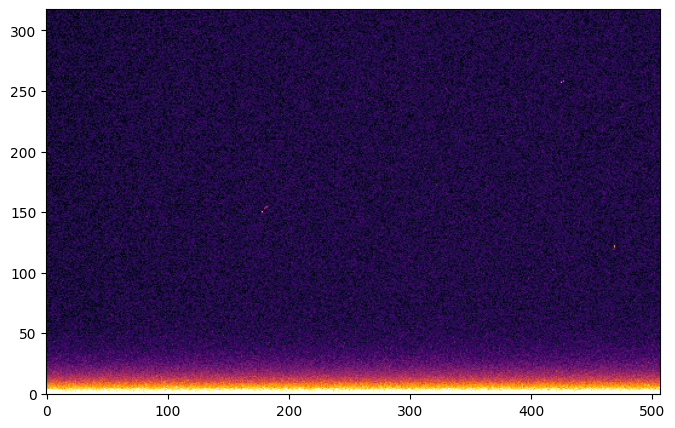

In [3]:
quantile_imshow(images["BIAS 25"].T)

In [4]:
def bias_model(x,y,/,m=0,b=1000,A=300,c=100,n=1):
    return m*x + b + n*x**2 + A*np.exp(-y/c)
BiasModel = custom_model(bias_model)
bias_model = BiasModel()

bias = images["BIAS 25"]
X,Y = np.mgrid[:bias.shape[0],:bias.shape[1]]
bias_model = fitter(bias_model,X,Y,bias)(X,Y)

In [5]:
images.keys()

dict_keys(['BIAS 25', 'FLAT B 5', 'FLAT V 5', 'V 1', 'V 2', 'B 1', 'B 2'])

In [6]:
def procesar(imag, name_flat, name2):
    flat = imag[name_flat]
    flat -= bias_model
    flat /= flat.mean()
    
    im = images[name2] - bias_model
    im /= flat
    
    return im

In [7]:
imgV1 = procesar(images, "FLAT V 5", "V 1")
imgV2 = procesar(images, "FLAT V 5", "V 2")
imgB1 = procesar(images, "FLAT B 5", "B 1")
imgB2 = procesar(images, "FLAT B 5", "B 2")

## Source finding

### Masking

In [8]:
XV1,YV1 = np.mgrid[:imgV1.shape[0],:imgV1.shape[1]]
XV2,YV2 = np.mgrid[:imgV2.shape[0],:imgV2.shape[1]]
XB1,YB1 = np.mgrid[:imgB1.shape[0],:imgB1.shape[1]]
XB2,YB2 = np.mgrid[:imgB2.shape[0],:imgB2.shape[1]]

In [9]:
maskV1 = (XV1>15) & (XV1<470) & (YV1>10) & (YV1<295)
maskV2 = (XV2>15) & (XV2<470) & (YV2>10) & (YV2<295)
maskB1 = (XB1>15) & (XB1<470) & (YB1>10) & (YB1<295)
maskB2 = (XB2>15) & (XB2<470) & (YB2>10) & (YB2<295)

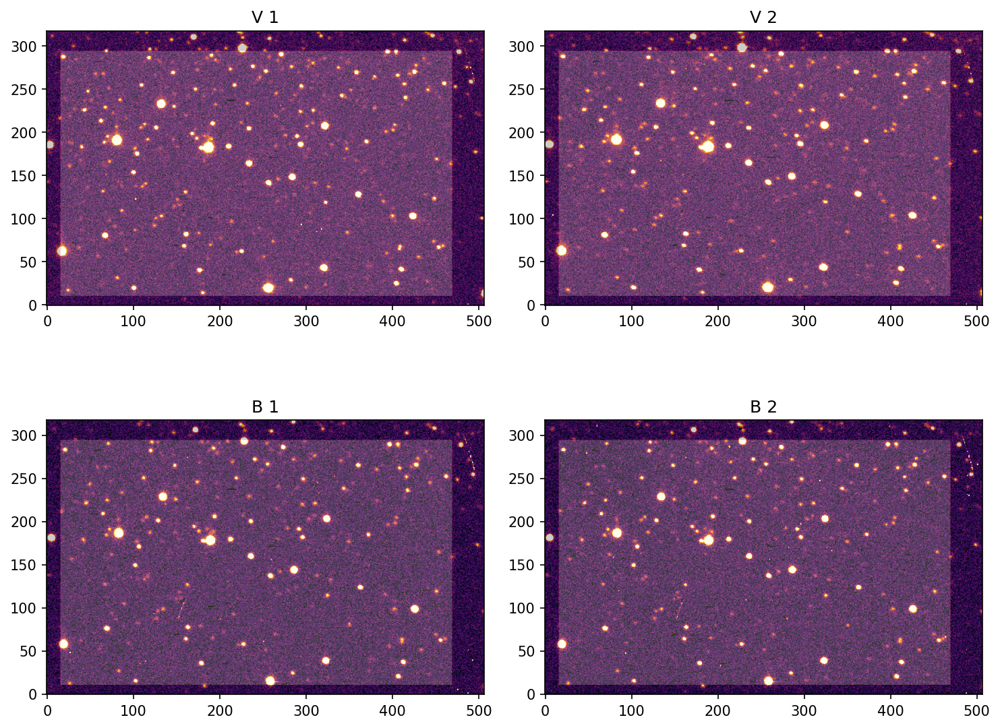

In [10]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi = 150)

lower = 0.01 
upper = 0.99  

img_v1min = np.quantile(imgV1.T, lower) 
img_v1max = np.quantile(imgV1.T, upper)

ax1 = axs[0, 0]
ax1.imshow(imgV1.T, vmin=img_v1min, vmax=img_v1max) 
ax1.imshow(maskV1.T, alpha=0.2)
ax1.set_title('V 1')

img_v2min = np.quantile(imgV2.T, lower) 
img_v2max = np.quantile(imgV2.T, upper)

ax2 = axs[0, 1]
ax2.imshow(imgV2.T, vmin=img_v2min, vmax=img_v2max) 
ax2.imshow(maskV2.T,alpha=0.2)
ax2.set_title('V 2')

img_b1min = np.quantile(imgV2.T, lower) 
img_b1max = np.quantile(imgV2.T, upper)

ax3 = axs[1, 0]
ax3.imshow(imgB1.T, vmin=img_b1min, vmax=img_b1max) 
ax3.imshow(maskB1.T,alpha=0.2)
ax3.set_title('B 1')

img_b2min = np.quantile(imgV2.T, lower) 
img_b2max = np.quantile(imgV2.T, upper)

ax4 = axs[1, 1]
ax4.imshow(imgB2.T, vmin=img_b2min, vmax=img_b2max) 
ax4.imshow(maskB2.T,alpha=0.2)
ax4.set_title('B 2')

plt.tight_layout()
plt.savefig('data/m92/mascaras.jpeg')
plt.show()

### Centroids

In [11]:
from skimage.feature import peak_local_max
from photutils.centroids import centroid_sources, centroid_quadratic # can be any of centroid_1dg, centroid_2dg, centroid_com, centroid_quadratic

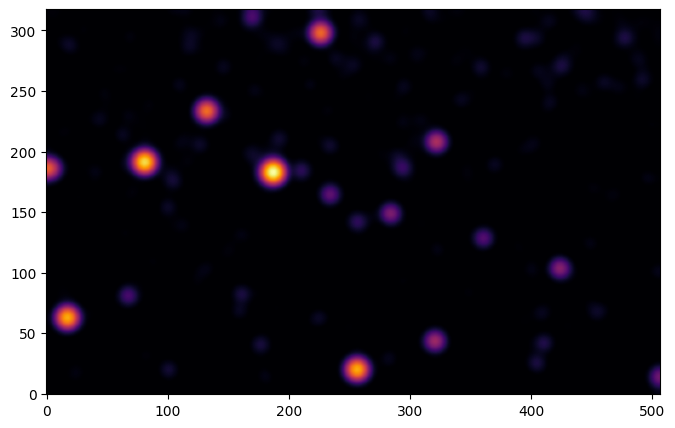

In [12]:
plt.imshow(ndi.gaussian_filter(imgV1,5).T,vmin=50,norm="log")
plt.savefig('nose.png')

In [13]:
def peaks(img, mask):
    peaks = peak_local_max(
    ndi.gaussian_filter(img,5),
    threshold_abs=60,
    labels=mask*1,
    min_distance=7,
    exclude_border=20
)
    return peaks

In [14]:
peaksV1 = peaks(imgV1, maskV1)
peaksV2 = peaks(imgV2, maskV2)
peaksB1 = peaks(imgB1, maskB1)
peaksB2 = peaks(imgB2, maskB2)

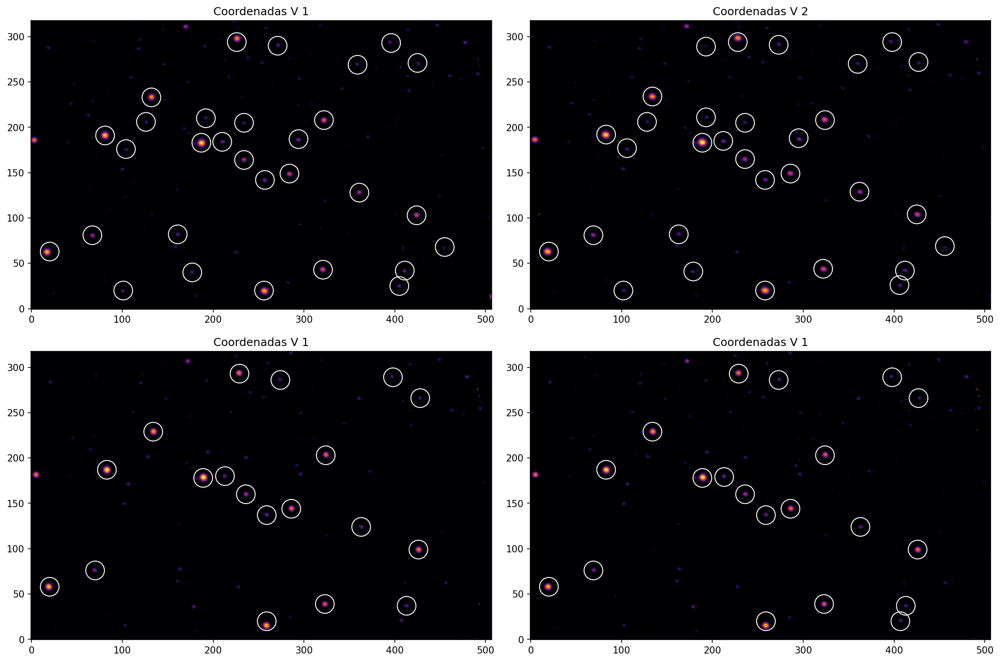

In [15]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10), dpi = 150)

ax1 = axs[0, 0]
ax1.imshow(imgV1.T,vmin=70,norm="log")
ax1.scatter(*peaksV1.T,fc="none",ec="w",s=400)
ax1.set_title('Coordenadas V 1')

ax2 = axs[0, 1]
ax2.imshow(imgV2.T,vmin=70,norm="log")
ax2.scatter(*peaksV2.T,fc="none",ec="w",s=400)
ax2.set_title('Coordenadas V 2')

ax3 = axs[1, 0]
ax3.imshow(imgB1.T,vmin=70,norm="log")
ax3.scatter(*peaksB1.T,fc="none",ec="w",s=400)
ax3.set_title('Coordenadas V 1')

ax4 = axs[1, 1]
ax4.imshow(imgB2.T,vmin=70,norm="log")
ax4.scatter(*peaksB2.T,fc="none",ec="w",s=400)
ax4.set_title('Coordenadas V 1')

plt.tight_layout()
plt.savefig('data/m92/coord.jpeg')
plt.show()

In [16]:
centroidsV1 = np.array(centroid_sources((imgV1-imgV1.mean()).T,*peaksV1.T,centroid_func=centroid_quadratic,box_size=9)).T

centroidsV2 = np.array(centroid_sources((imgV2-imgV2.mean()).T,*peaksV2.T,centroid_func=centroid_quadratic,box_size=9)).T

centroidsB1 = np.array(centroid_sources((imgB1-imgB1.mean()).T,*peaksB1.T,centroid_func=centroid_quadratic,box_size=9)).T

centroidsB2 = np.array(centroid_sources((imgB2-imgB2.mean()).T,*peaksB2.T,centroid_func=centroid_quadratic,box_size=9)).T

In [17]:
distancesV1 = np.hypot(*(peaksV1-centroidsV1).T)

distancesV2 = np.hypot(*(peaksV2-centroidsV2).T)

distancesB1 = np.hypot(*(peaksB1-centroidsB1).T)

distancesB2 = np.hypot(*(peaksB2-centroidsB2).T)

In [18]:
distancesV1

array([0.21098386, 0.06704233, 0.26764417, 2.90448122, 0.27512109, 4.        , 0.10259808, 0.48805726, 0.54561566,
       0.25972405, 0.27383499, 0.38073527, 0.30503269, 0.79107571, 0.42023381, 0.57218225, 0.64957925, 1.71133149,
       1.07201563, 0.17048924, 0.93161629, 0.30396154, 0.63082429, 0.87180766, 0.20689918, 0.3577951 , 0.95171265,
       0.24338308, 1.48376055, 0.74819804])

Text(0.5, 0, 'Distance correction [pix]')

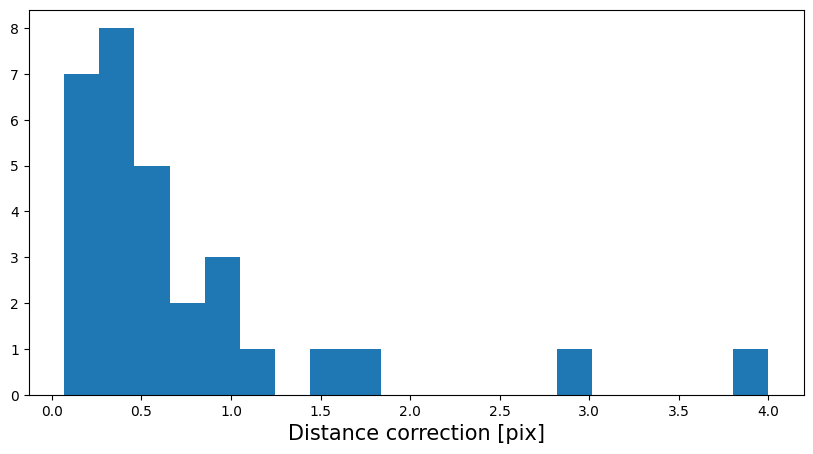

In [19]:
plt.hist(distancesV1,bins=20);
plt.xlabel("Distance correction [pix]")

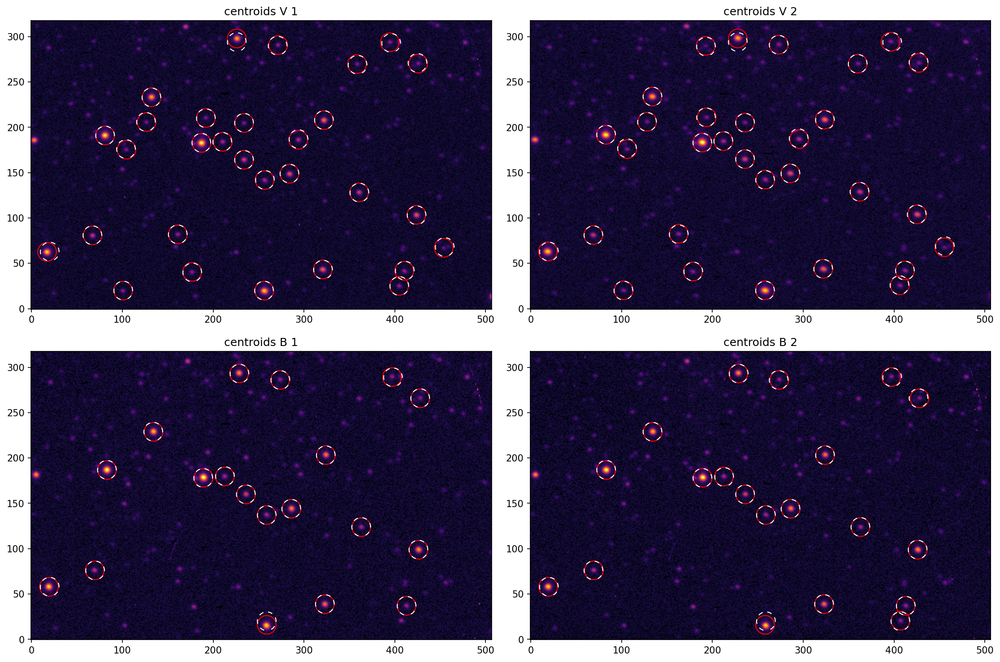

In [20]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10), dpi = 150)

ax1 = axs[0, 0]
ax1.imshow(imgV1.T,vmin=30,norm="log")
ax1.scatter(*centroidsV1.T,fc="none",ec="r",s=400)
ax1.scatter(*peaksV1.T,fc="none",ec="w",s=400,linestyle=(5,(5,5)))
ax1.set_title('centroids V 1')

ax2 = axs[0, 1]
ax2.imshow(imgV2.T,vmin=30,norm="log")
ax2.scatter(*centroidsV2.T,fc="none",ec="r",s=400)
ax2.scatter(*peaksV2.T,fc="none",ec="w",s=400,linestyle=(5,(5,5)))
ax2.set_title('centroids V 2')

ax3 = axs[1, 0]
ax3.imshow(imgB1.T,vmin=30,norm="log")
ax3.scatter(*centroidsB1.T,fc="none",ec="r",s=400)
ax3.scatter(*peaksB1.T,fc="none",ec="w",s=400,linestyle=(5,(5,5)))
ax3.set_title('centroids B 1')

ax4 = axs[1, 1]
ax4.imshow(imgB2.T,vmin=30,norm="log")
ax4.scatter(*centroidsB2.T,fc="none",ec="r",s=400)
ax4.scatter(*peaksB2.T,fc="none",ec="w",s=400,linestyle=(5,(5,5)))
ax4.set_title('centroids B 2')

plt.tight_layout()
plt.savefig('data/m92/centroids.jpeg')
plt.show()

## Radial profile and FWHM

In [21]:
from photutils.aperture import CircularAperture, ApertureStats
from photutils.profiles import RadialProfile
from astropy.modeling.models import Gaussian1D,Voigt1D,Const1D
from astropy.modeling.fitting import LevMarLSQFitter
fitter = LevMarLSQFitter(calc_uncertainties=True)

In [22]:
model = Const1D(100) + Gaussian1D(5e3,0,1.5)
model.mean_1.fixed = True

In [23]:
radii = np.arange(0,10,1)

profileV1 = RadialProfile(imgV1.T,centroidsV1[0],radii)
fitted_modelV1 = fitter(model,profileV1.radius,profileV1.profile)

profileV2 = RadialProfile(imgV2.T,centroidsV2[0],radii)
fitted_modelV2 = fitter(model,profileV2.radius,profileV2.profile)

profileB1 = RadialProfile(imgB1.T,centroidsB1[0],radii)
fitted_modelB1 = fitter(model,profileB1.radius,profileB1.profile)

profileB2 = RadialProfile(imgB2.T,centroidsB2[0],radii)
fitted_model = fitter(model,profileB2.radius,profileB2.profile)

In [24]:
def fwhm(centroids, img, ):
    params = []
    params_std = []
    for c in centroids:
        try:
            profile = RadialProfile(img.T,c,radii)
            fitted_model = fitter(model,profile.radius,profile.profile)
            params_std.append(np.sqrt(np.diag(fitter.fit_info["param_cov"])))
            params.append(fitted_model.parameters)
        except ValueError:
            pass
    
    params = np.asarray(params)
    params_std = np.asarray(params_std)
    
    x = np.log10(params.T[1])
    y = 2*np.sqrt(2*np.log(2))*params.T[3]
    dx = params_std.T[1]/params.T[1] / np.log(10)
    dy = 2*np.sqrt(2*np.log(2))*params_std.T[2]

    samples = np.random.normal(loc=y,scale=dy,size=(10_000,len(y)))
    means = samples.mean(axis=1)

    FWHM = means.mean()
    FWHM_err = means.std()
    
    return FWHM, FWHM_err, x, y, dy, dx

In [25]:
FWHMV1 = fwhm(centroidsV1, imgV1)
FWHMV2 = fwhm(centroidsV2, imgV2)
FWHMB1 = fwhm(centroidsB1, imgB1)
FWHMB2 = fwhm(centroidsB2, imgB2)

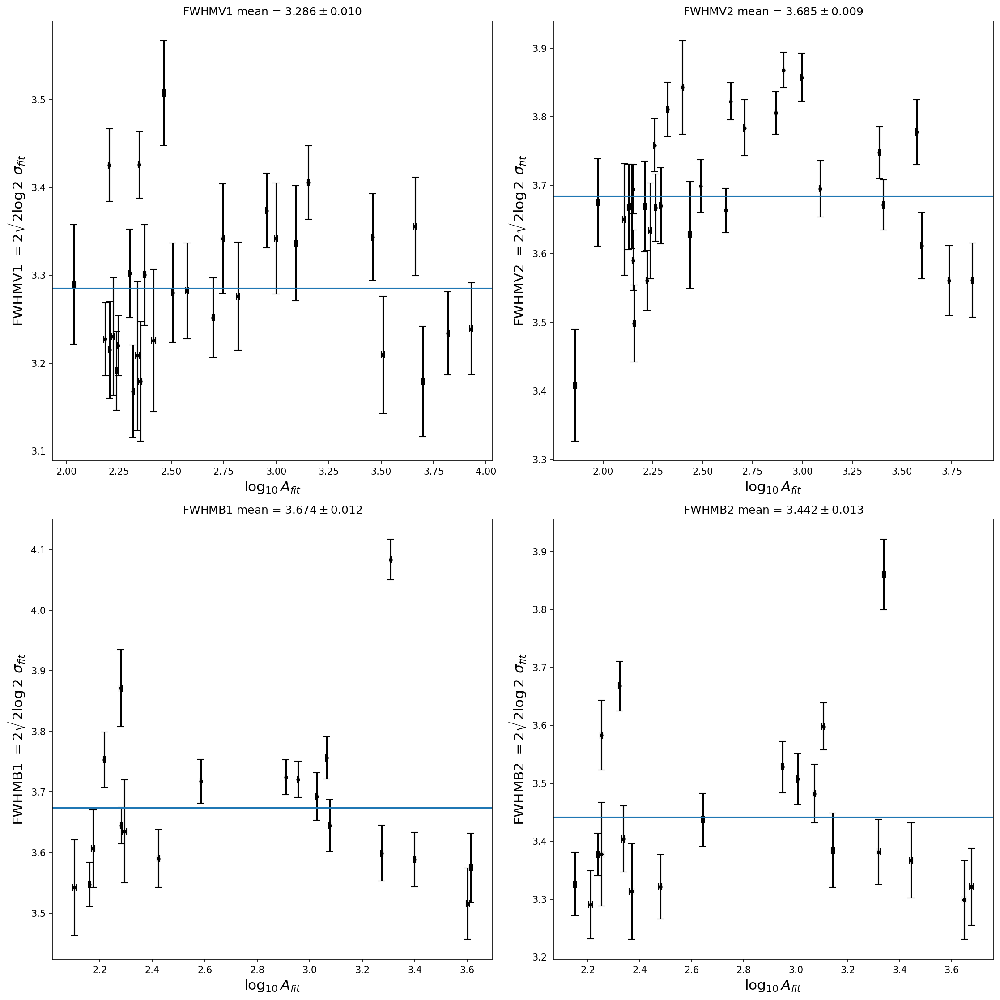

In [44]:
fig, axs = plt.subplots(2, 2, figsize=(15, 15), dpi = 150)

ax1 = axs[0, 0]
ax1.errorbar(FWHMV1[2],FWHMV1[3],FWHMV1[4],FWHMV1[5],fmt=". k",capsize=4)
ax1.set_xlabel("$\\log_{10} A_{fit}$")
ax1.set_ylabel("FWHMV1 $= 2\\sqrt{2\\log 2}\\;\\sigma_{fit}$")
ax1.axhline(FWHMV1[0])
ax1.set_title(f"FWHMV1 mean = ${FWHMV1[0]:.3f}\\pm{FWHMV1[1]:.3f}$")

ax2 = axs[0, 1]
ax2.errorbar(FWHMV2[2],FWHMV2[3],FWHMV2[4],FWHMV2[5],fmt=". k",capsize=4)
ax2.set_xlabel("$\\log_{10} A_{fit}$")
ax2.set_ylabel("FWHMV2 $= 2\\sqrt{2\\log 2}\\;\\sigma_{fit}$")
ax2.axhline(FWHMV2[0])
ax2.set_title(f"FWHMV2 mean = ${FWHMV2[0]:.3f}\\pm{FWHMV2[1]:.3f}$")

ax3 = axs[1, 0]
ax3.errorbar(FWHMB1[2],FWHMB1[3],FWHMB1[4],FWHMB1[5],fmt=". k",capsize=4)
ax3.set_xlabel("$\\log_{10} A_{fit}$")
ax3.set_ylabel("FWHMB1 $= 2\\sqrt{2\\log 2}\\;\\sigma_{fit}$")
ax3.axhline(FWHMB1[0])
ax3.set_title(f"FWHMB1 mean = ${FWHMB1[0]:.3f}\\pm{FWHMB1[1]:.3f}$")

ax4 = axs[1, 1]
ax4.errorbar(FWHMB2[2],FWHMB2[3],FWHMB2[4],FWHMB2[5],fmt=". k",capsize=4)
ax4.set_xlabel("$\\log_{10} A_{fit}$")
ax4.set_ylabel("FWHMB2 $= 2\\sqrt{2\\log 2}\\;\\sigma_{fit}$")
ax4.axhline(FWHMB2[0])
ax4.set_title(f"FWHMB2 mean = ${FWHMB2[0]:.3f}\\pm{FWHMB2[1]:.3f}$")

plt.tight_layout()
plt.savefig('data/m92/fwhm.jpeg')
plt.show()

amplitud en x y ancho en y, deberiamos velar porque no varie mucho la dispersion. Entre as tenue menos exacto es el fit lado debil donde hay mas puntos por eos uno coge los 30 mas brillantes 

In [45]:
from sklearn.neighbors import NearestNeighbors

distanciaminV1, indx = NearestNeighbors(n_neighbors=2).fit(centroidsV1).kneighbors(centroidsV1)
mindistanceV1 = min(distanciaminV1[:,1])

distanciaminV2, indx = NearestNeighbors(n_neighbors=2).fit(centroidsV2).kneighbors(centroidsV2)
mindistanceV2 = min(distanciaminV2[:,1])

distanciaminB1, indx = NearestNeighbors(n_neighbors=2).fit(centroidsB1).kneighbors(centroidsB1)
mindistanceB1 = min(distanciaminB1[:,1])

distanciaminB2, indx = NearestNeighbors(n_neighbors=2).fit(centroidsB2).kneighbors(centroidsB2)
mindistanceB2 = min(distanciaminB2[:,1])

'distanciaminV1, indx = NearestNeighbors(n_neighbors=2).fit(centroidsV1).kneighbors(centroidsV1)\nmindistanceV1 = min(distanciaminV1[:,1])\n\ndistanciaminV2, indx = NearestNeighbors(n_neighbors=2).fit(centroidsV2).kneighbors(centroidsV2)\nmindistanceV2 = min(distanciaminV2[:,1])\n\ndistanciaminB1, indx = NearestNeighbors(n_neighbors=2).fit(centroidsB1).kneighbors(centroidsB1)\nmindistanceB1 = min(distanciaminB1[:,1])\n\ndistanciaminB2, indx = NearestNeighbors(n_neighbors=2).fit(centroidsB2).kneighbors(centroidsB2)\nmindistanceB2 = min(distanciaminB2[:,1])'

In [47]:
from photutils.aperture import CircularAnnulus

In [48]:
sky_aperturesV1 = CircularAnnulus(centroidsV1, 2*FWHMV1[0], 0.72*(mindistanceV1-FWHMV1[0])) #anillos de cielo
star_aperturesV1 = CircularAperture(centroidsV1, FWHMV1[0])

sky_aperturesV2 = CircularAnnulus(centroidsV2, 2*FWHMV2[0], 0.72*(mindistanceV2-FWHMV2[0])) #anillos de cielo
star_aperturesV2 = CircularAperture(centroidsV2, FWHMV2[0])

sky_aperturesB1 = CircularAnnulus(centroidsB1, 2*FWHMB1[0], 0.72*(mindistanceB1-FWHMB1[0])) #anillos de cielo
star_aperturesB1 = CircularAperture(centroidsB1, FWHMB1[0])

sky_aperturesB2 = CircularAnnulus(centroidsB2, 2*FWHMB2[0], 0.72*(mindistanceB2-FWHMB2[0])) #anillos de cielo
star_aperturesB2 = CircularAperture(centroidsB2, FWHMB2[0])


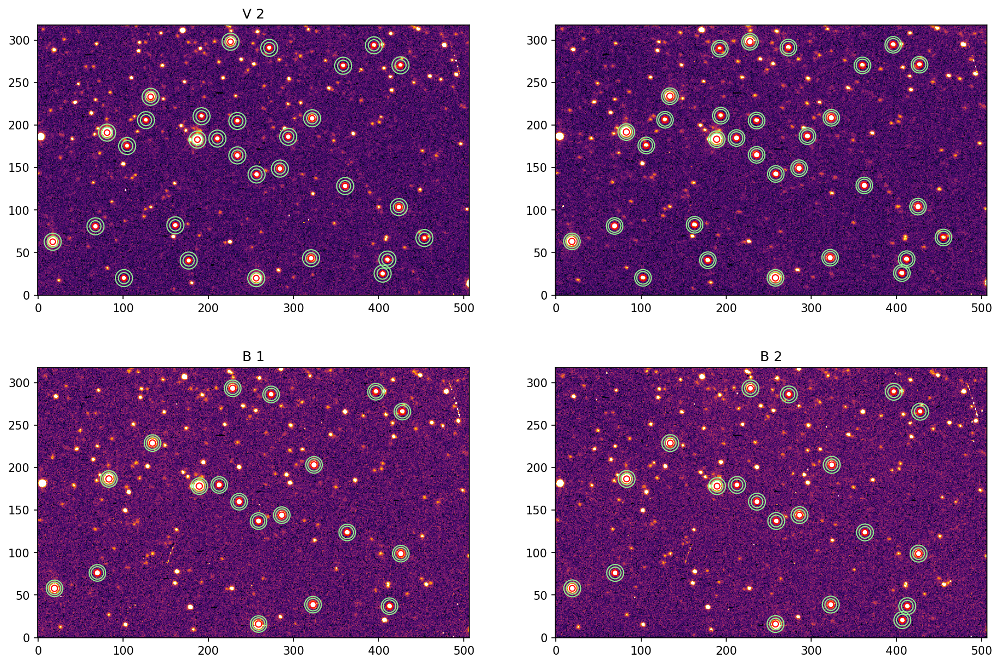

In [62]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10), dpi = 150)

lower = 0.01 
upper = 0.99  

img_v1min = np.quantile(imgV1.T, 0.01) 
img_v1max = np.quantile(imgV1.T, 0.99)

ax1 = axs[0, 0]
ax1.imshow(imgV1.T, vmin=img_v1min, vmax=img_v1max) 
sky_aperturesV1.plot(ax=ax1, color='lightgreen') 
star_aperturesV1.plot(ax=ax1, color='red')
ax1.set_title('V 1')

img_v2min = np.quantile(imgV2.T, 0.01) 
img_v2max = np.quantile(imgV2.T, 0.99)

ax2 = axs[0, 1]
ax2.imshow(imgV2.T, vmin=img_v2min, vmax=img_v2max) 
sky_aperturesV2.plot(ax=ax2, color='lightgreen') 
star_aperturesV2.plot(ax=ax2, color='red')
ax1.set_title('V 2')

img_b1min = np.quantile(imgB1.T, 0.01) 
img_b1max = np.quantile(imgB1.T, 0.99)

ax3 = axs[1, 0]
ax3.imshow(imgB1.T, vmin=img_b1min, vmax=img_b1max) 
sky_aperturesB1.plot(ax=ax3, color='lightgreen') 
star_aperturesB1.plot(ax=ax3, color='red')
ax3.set_title('B 1')

img_b2min = np.quantile(imgB2.T, 0.01) 
img_b2max = np.quantile(imgB2.T, 0.99)

ax4 = axs[1, 1]
ax4.imshow(imgB2.T, vmin=img_b2min, vmax=img_b2max) 
sky_aperturesB2.plot(ax=ax4, color='lightgreen') 
star_aperturesB2.plot(ax=ax4, color='red')
ax4.set_title('B 2')

plt.savefig('data/m92/aperturas.jpeg')
plt.show()


In [63]:
sky_valuesV1 = ApertureStats(imgV1.T, sky_aperturesV1).median
star_valuesV1 = ApertureStats(imgV1.T, star_aperturesV1).sum / star_aperturesV1.area

sky_valuesV2 = ApertureStats(imgV2.T, sky_aperturesV2).median
star_valuesV2 = ApertureStats(imgV2.T, star_aperturesV2).sum / star_aperturesV2.area

sky_valuesB1 = ApertureStats(imgB1.T, sky_aperturesB1).median
star_valuesB1 = ApertureStats(imgB1.T, star_aperturesB1).sum / star_aperturesB1.area

sky_valuesB2 = ApertureStats(imgB2.T, sky_aperturesB2).median
star_valuesB2 = ApertureStats(imgB2.T, star_aperturesB2).sum / star_aperturesB2.area


In [64]:
mag_ins_V1 = -2.5 * np.log10((star_valuesV1 - sky_valuesV1)/60)+25
mag_ins_V2 = -2.5 * np.log10((star_valuesV2 - sky_valuesV2)/60)+25
mag_ins_B1 = -2.5 * np.log10((star_valuesB1 - sky_valuesB1)/60)+25
mag_ins_B2 = -2.5 * np.log10((star_valuesB2 - sky_valuesB2)/60)+25

In [65]:
def convertirgrados(zd):
    horas, minutos, segundos = map(float, zd.split(":"))
    total_segundos = horas * 3600 + minutos * 60 + segundos
    gradosz = total_segundos / 3600
    return gradosz

def calcular_X(z):
    X = 1 / (np.cos(np.radians(z)) + 0.025* np.exp(-11 * np.cos(np.radians(z))))
    return X

In [66]:
ZV1 = convertirgrados(headers["V 1"]["ZD"])
ZV2 = convertirgrados(headers["V 2"]["ZD"])
ZB1 = convertirgrados(headers["B 1"]["ZD"])
ZB2 = convertirgrados(headers["B 2"]["ZD"])

In [67]:
mXV1 = 0.02*calcular_X(ZV1)
mXV2 = 0.02*calcular_X(ZV2)
mXB1 = 0.04*calcular_X(ZB1)
mXB2 = 0.04*calcular_X(ZB2)

In [68]:
mag_ins_V1 += mXV1
mag_ins_V2 += mXV2
mag_ins_B1 += mXB1
mag_ins_B2 += mXB2

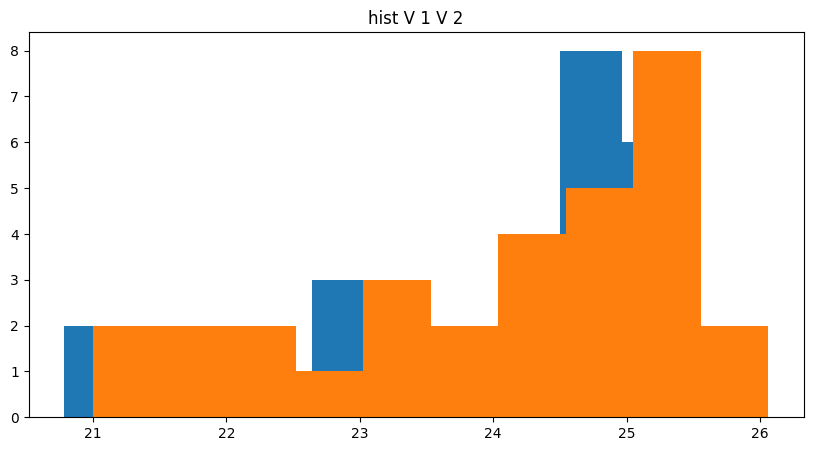

In [75]:
plt.hist(mag_ins_V1)
plt.hist(mag_ins_V2)
plt.title('hist V 1 V 2')
plt.savefig('data/m92/hisV.jpeg')

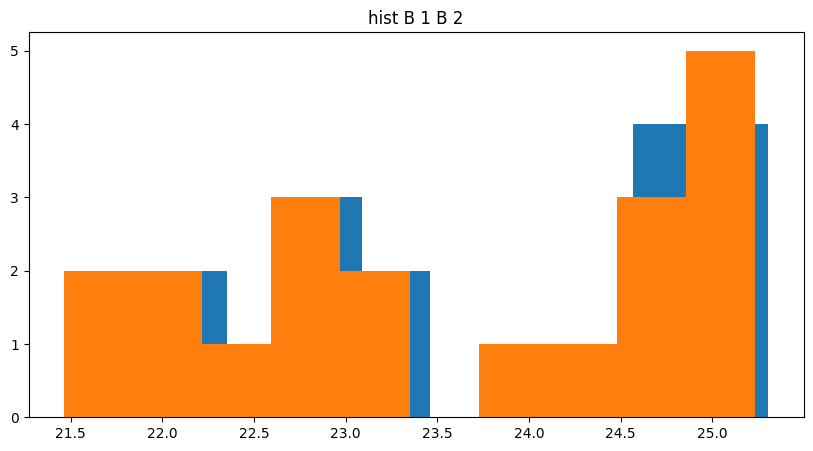

In [76]:
plt.hist(mag_ins_B1)
plt.hist(mag_ins_B2)
plt.title('hist B 1 B 2')
plt.savefig('data/m92/histB.jpeg')

In [71]:
from photutils.utils import calc_total_error

background = np.sqrt(25) * np.std(bias - bias_model)
bacimg = np.ones_like(bias) - background

In [72]:
img_err_V1 = calc_total_error(imgV1, bacimg, 10.5)
star_err_V1 = np.array([np.linalg.norm(s.to_mask().get_values(img_err_V1.T)/ star_aperturesV1.area) for s in star_aperturesV1])
sky_err_V1  = np.array([np.linalg.norm(s.to_mask().get_values(img_err_V1.T)/ sky_aperturesV1.area) for s in sky_aperturesV1])

img_err_V2 = calc_total_error(imgV2, bacimg, 10.5)
star_err_V2 = np.array([np.linalg.norm(s.to_mask().get_values(img_err_V2.T)/ star_aperturesV2.area) for s in star_aperturesV2])
sky_err_V2  = np.array([np.linalg.norm(s.to_mask().get_values(img_err_V2.T)/ sky_aperturesV2.area) for s in sky_aperturesV2])

img_err_B1 = calc_total_error(imgB1, bacimg, 10.5)
star_err_B1 = np.array([np.linalg.norm(s.to_mask().get_values(img_err_B1.T)/ star_aperturesB1.area) for s in star_aperturesB1])
sky_err_B1  = np.array([np.linalg.norm(s.to_mask().get_values(img_err_B1.T)/ sky_aperturesB1.area) for s in sky_aperturesB1])

img_err_B2 = calc_total_error(imgB2, bacimg, 10.5)
star_err_B2 = np.array([np.linalg.norm(s.to_mask().get_values(img_err_B2.T)/ star_aperturesB2.area) for s in star_aperturesB2])
sky_err_B2  = np.array([np.linalg.norm(s.to_mask().get_values(img_err_B2.T)/ sky_aperturesB2.area) for s in sky_aperturesB2])

In [73]:
mag_err_V1 = 5/2 * (1/np.log(10))* np.sqrt(star_err_V1**2 + sky_err_V1**2) / np.abs(star_err_V1 - sky_err_V1)
mag_err_V2 = 5/2 * (1/np.log(10))* np.sqrt(star_err_V2**2 + sky_err_V2**2) / np.abs(star_err_V2 - sky_err_V2)
mag_err_B1 = 5/2 * (1/np.log(10))* np.sqrt(star_err_B1**2 + sky_err_B1**2) / np.abs(star_err_B1 - sky_err_B1)
mag_err_B2 = 5/2 * (1/np.log(10))* np.sqrt(star_err_B2**2 + sky_err_B2**2) / np.abs(star_err_B2 - sky_err_B2)

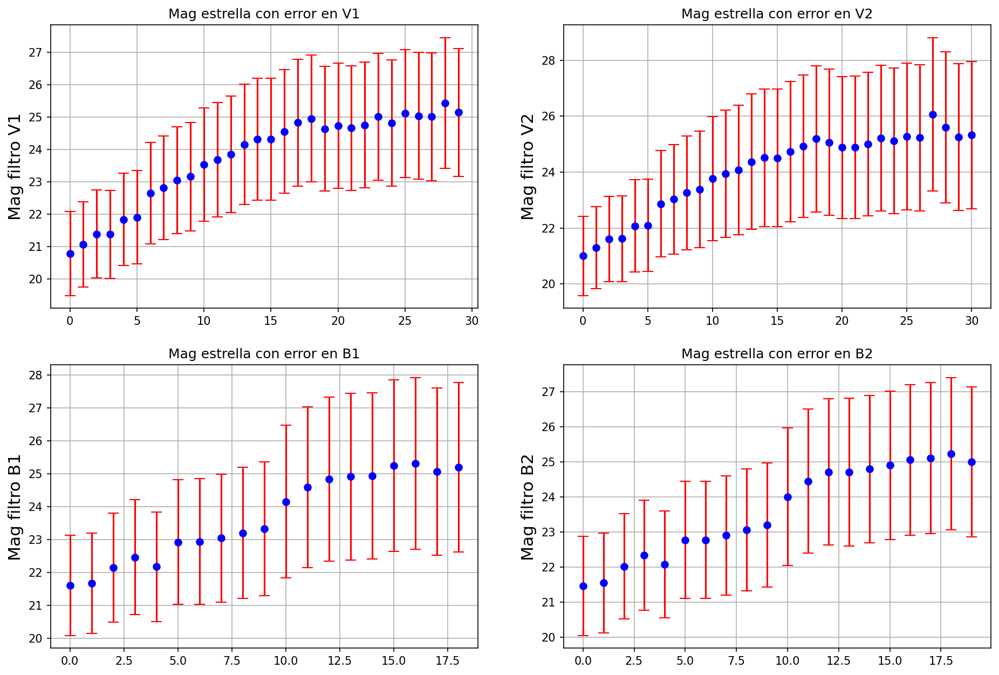

In [77]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10), dpi = 150)

ax1 = axs[0,0]
ax1.errorbar(np.arange(len(mag_ins_V1)), mag_ins_V1, yerr = mag_err_V1, fmt = 'o', color = 'blue', ecolor = 'red', capsize = 5)
ax1.set_ylabel('Mag filtro V1')
ax1.set_title('Mag estrella con error en V1')
ax1.grid(True)

ax2 = axs[0,1]
ax2.errorbar(np.arange(len(mag_ins_V2)), mag_ins_V2, yerr = mag_err_V2, fmt = 'o', color = 'blue', ecolor = 'red', capsize = 5)
ax2.set_ylabel('Mag filtro V2')
ax2.set_title('Mag estrella con error en V2')
ax2.grid(True)

ax3 = axs[1,0]
ax3.errorbar(np.arange(len(mag_ins_B1)), mag_ins_B1, yerr = mag_err_B1, fmt = 'o', color = 'blue', ecolor = 'red', capsize = 5)
ax3.set_ylabel('Mag filtro B1')
ax3.set_title('Mag estrella con error en B1')
ax3.grid(True)

ax4 = axs[1,1]
ax4.errorbar(np.arange(len(mag_ins_B2)), mag_ins_B2, yerr = mag_err_B2, fmt = 'o', color = 'blue', ecolor = 'red', capsize = 5)
ax4.set_ylabel('Mag filtro B2')
ax4.set_title('Mag estrella con error en B2')
ax4.grid(True)

plt.savefig('data/m92/magn.jpeg')
plt.show()